Building an LDA Topic Model for Grouping Songs by Their Lyrics

In [3]:
# Import Libraries

import numpy as np
import pandas as pd
pd.set_option('max_colwidth', 600)
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
sns.set(style='darkgrid', font_scale=1.6)
import spacy
import random
from gensim import models, corpora, similarities
from wordcloud import WordCloud
from IPython.display import display, Markdown


In [4]:
# Load data into list
songs_df = pd.read_csv("spotify_millsongdata.csv")
data = list(songs_df["text"])

# Print length and example
print("Number of songs:", len(data))
print("\nFirst song:", data[0])

Number of songs: 57650

First song: Look at her face, it's a wonderful face  
And it means something special to me  
Look at the way that she smiles when she sees me  
How lucky can one fellow be?  
  
She's just my kind of girl, she makes me feel fine  
Who could ever believe that she could be mine?  
She's just my kind of girl, without her I'm blue  
And if she ever leaves me what could I do, what could I do?  
  
And when we go for a walk in the park  
And she holds me and squeezes my hand  
We'll go on walking for hours and talking  
About all the things that we plan  
  
She's just my kind of girl, she makes me feel fine  
Who could ever believe that she could be mine?  
She's just my kind of girl, without her I'm blue  
And if she ever leaves me what could I do, what could I do?




In [5]:
# Clean text
clean_data = [i.replace('\n','').replace('\r','') for i in data]

In [6]:
# Load English language model
nlp = spacy.load("en_core_web_sm")

# Disable named-entity recognition and parsing to save time
unwanted_pipes = ["ner", "parser"]

# Custom tokenizer using spacy
def custom_tokenizer(doc):
    with nlp.disable_pipes(*unwanted_pipes):
        return [t.lemma_ for t in nlp(doc) if t.is_alpha and not t.is_space and not t.is_punct and not t.is_stop and t.pos_ in ["ADJ","NOUN","VERB"]]

In [9]:
%%time

# Tokenize data
tokenized_data = list(map(custom_tokenizer, nlp.pipe(clean_data, n_process=8, batch_size=1000)))

# Print example
print(tokenized_data[0])

c:\Users\Ugo Anyaegbunam\Downloads\nlp_final\nlp_final\.venv\lib\site-packages\spacy\language.py:1067: DeprecationWarning: [W096] The method `nlp.disable_pipes` is now deprecated - use `nlp.select_pipes` instead.
  warnings.warn(Warnings.W096, DeprecationWarning)
c:\Users\Ugo Anyaegbunam\Downloads\nlp_final\nlp_final\.venv\lib\site-packages\spacy\language.py:1067: DeprecationWarning: [W096] The method `nlp.disable_pipes` is now deprecated - use `nlp.select_pipes` instead.
  warnings.warn(Warnings.W096, DeprecationWarning)
c:\Users\Ugo Anyaegbunam\Downloads\nlp_final\nlp_final\.venv\lib\site-packages\spacy\language.py:1067: DeprecationWarning: [W096] The method `nlp.disable_pipes` is now deprecated - use `nlp.select_pipes` instead.
  warnings.warn(Warnings.W096, DeprecationWarning)
c:\Users\Ugo Anyaegbunam\Downloads\nlp_final\nlp_final\.venv\lib\site-packages\spacy\language.py:1067: DeprecationWarning: [W096] The method `nlp.disable_pipes` is now deprecated - use `nlp.select_pipes` inst

['look', 'face', 'wonderful', 'face', 'mean', 'special', 'look', 'way', 'smile', 'see', 'lucky', 'fellow', 'kind', 'girl', 'make', 'feel', 'fine', 'believe', 'kind', 'girl', 'blue', 'leave', 'walk', 'park', 'hold', 'squeeze', 'hand', 'walk', 'hour', 'talk', 'thing', 'plan', 'kind', 'girl', 'make', 'feel', 'fine', 'believe', 'kind', 'girl', 'blue', 'leave']
CPU times: total: 35min 18s
Wall time: 46min 33s


In [10]:
# Build dictionary of (token, ID) mappings
dct = corpora.Dictionary(tokenized_data)

# Print vocab size
print('Size of vocabulary before filtering:', len(dct))

# Filter overly low and high frequency tokens
dct.filter_extremes(no_below=5, no_above=0.5)

# Print vocab size
print('\nSize of vocabulary after filtering:', len(dct))

# Example mappings
print("\nExample mappings:", [(i,dct.token2id[i]) for i in tokenized_data[0][:10]])

Size of vocabulary before filtering: 48255

Size of vocabulary after filtering: 13085

Example mappings: [('look', 12), ('face', 2), ('wonderful', 26), ('face', 2), ('mean', 15), ('special', 20), ('look', 12), ('way', 25), ('smile', 19), ('see', 18)]


In [11]:
# Bag-of-Words sparse matrix
bow = [dct.doc2bow(i) for i in tokenized_data]


In [12]:
%%time

# Train LDA model
lda_model = models.LdaModel(corpus=bow, num_topics=20, passes=10, alpha='auto', eta='auto', id2word=dct, random_state=0)




CPU times: total: 3min 14s
Wall time: 3min 17s


In [13]:
# Print generated topics
lda_model.print_topics()

[(0,
  '0.110*"life" + 0.081*"world" + 0.070*"live" + 0.062*"dream" + 0.049*"believe" + 0.033*"free" + 0.031*"find" + 0.025*"hope" + 0.020*"end" + 0.016*"alive"'),
 (1,
  '0.073*"time" + 0.052*"way" + 0.047*"tell" + 0.044*"think" + 0.035*"thing" + 0.032*"leave" + 0.030*"try" + 0.026*"say" + 0.025*"mind" + 0.022*"find"'),
 (2,
  '0.253*"day" + 0.069*"blue" + 0.063*"new" + 0.059*"stop" + 0.046*"rain" + 0.046*"lonely" + 0.044*"year" + 0.040*"happy" + 0.022*"sad" + 0.019*"thank"'),
 (3,
  '0.208*"good" + 0.196*"girl" + 0.174*"little" + 0.048*"crazy" + 0.036*"fine" + 0.030*"lady" + 0.024*"bit" + 0.021*"guy" + 0.019*"babe" + 0.019*"pretty"'),
 (4,
  '0.043*"light" + 0.028*"sun" + 0.027*"fly" + 0.026*"sky" + 0.022*"shine" + 0.021*"star" + 0.018*"wind" + 0.013*"water" + 0.013*"moon" + 0.012*"sea"'),
 (5,
  '0.049*"old" + 0.030*"ride" + 0.025*"say" + 0.025*"town" + 0.022*"drive" + 0.019*"drink" + 0.019*"car" + 0.017*"house" + 0.014*"kid" + 0.013*"daddy"'),
 (6,
  '0.022*"fuck" + 0.022*"shit" + 

In [14]:
print(lda_model.alpha) # Document-topic prior
print(lda_model.eta) # Topic-word prior (beta)

[0.93140376 2.2607846  0.51754254 0.39538166 0.96794057 0.6824713
 0.5902439  0.4496586  0.5434248  0.2563673  0.50962275 0.22961672
 0.39598373 0.88395524 0.17942658 0.30798978 0.5660256  1.1901902
 1.1554126  0.57458276]
[0.04363547 0.04551828 0.05117664 ... 0.03892979 0.03892979 0.03892979]


In [15]:
# Get topics
topics = list(lda_model.get_document_topics(bow, minimum_probability=0))

# Print topic proportion in corpus
for i in range(20):
    print(f"Topic {i} proportion: {100*sum([pair[i][1] for pair in topics])/len(topics):.1f}%")

Topic 0 proportion: 6.9%
Topic 1 proportion: 17.1%
Topic 2 proportion: 3.6%
Topic 3 proportion: 2.8%
Topic 4 proportion: 7.9%
Topic 5 proportion: 5.1%
Topic 6 proportion: 4.7%
Topic 7 proportion: 3.1%
Topic 8 proportion: 4.6%
Topic 9 proportion: 1.9%
Topic 10 proportion: 3.4%
Topic 11 proportion: 1.5%
Topic 12 proportion: 2.6%
Topic 13 proportion: 6.4%
Topic 14 proportion: 1.2%
Topic 15 proportion: 2.1%
Topic 16 proportion: 4.3%
Topic 17 proportion: 8.4%
Topic 18 proportion: 8.3%
Topic 19 proportion: 4.2%


In [16]:
# Return top topics in a song
def get_top_topics(song_idx, min_prob):

    # Sort topics from highest to lowest frequency
    topics = sorted(lda_model.get_document_topics(bow[song_idx], minimum_probability=min_prob), key=lambda tup: tup[1])[::-1]

    # Get word distribution for each topic
    pairs = [lda_model.show_topic(pair[0]) for pair in topics]
    topic_words = [[pair[0] for pair in topic] for topic in pairs]

    return pd.DataFrame({'Major Topics': topics,'Topic Words': topic_words})

In [17]:
# Example
display(get_top_topics(100, 0.25))
print(data[100][:300])

,Major Topics,Topic Words


The city is a jungle, you better take care  
Never walk alone after midnight  
If you don't believe it you better beware  
Of me  
  
I am behind you, I'll always find you, I am the tiger  
People who fear me never go near me, I am the tiger  
  
The city is a nightmare, a horrible dream  



In [18]:
# Compute Perplexity
print('\nPerplexity: ', lda_model.log_perplexity(bow))  # a measure of how good the model is. lower the better.

# Coherence score (closer to 0 the better)
coherence_model_Umass = models.coherencemodel.CoherenceModel(model=lda_model, texts=tokenized_data, dictionary=dct, coherence='u_mass')
coherence_score = coherence_model_Umass.get_coherence()
print(f'UMass Coherence Score: {coherence_score:.4f}')


Perplexity:  -7.525085349478742
UMass Coherence Score: -3.2341


In [19]:
coherence_model_Uci = models.coherencemodel.CoherenceModel(model=lda_model, texts=tokenized_data, dictionary=dct, coherence='c_uci')
coherence_score = coherence_model_Uci.get_coherence()
print(f'Ucis Coherence Score: {coherence_score:.4f}')

Ucis Coherence Score: -0.1774


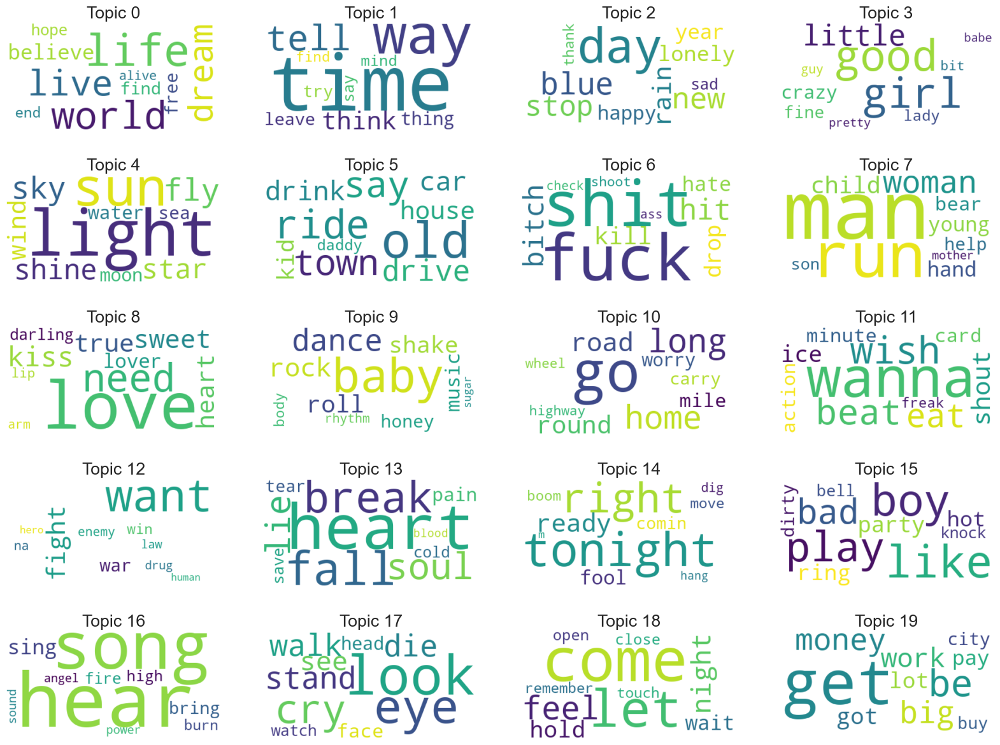

In [20]:
# Plot word clouds for each topic
word_cloud = WordCloud(background_color='white', max_words=10)
fig, axes = plt.subplots(5, 4, figsize=(20,15))

for i, ax in enumerate(axes.flatten()):
    fig.add_subplot(ax)
    topic_words = dict(lda_model.show_topic(i))
    word_cloud.generate_from_frequencies(topic_words)
    plt.gca().imshow(word_cloud, interpolation='bilinear')
    plt.gca().set_title(f'Topic {i}')
    plt.gca().axis('off')
plt.show()

In [21]:
import pyLDAvis
import pyLDAvis.gensim

pyLDAvis.enable_notebook()
vis = pyLDAvis.gensim.prepare(lda_model, bow, dct)
vis

PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
1     -0.147729 -0.035118       1        1  16.447461
17    -0.166874  0.151816       2        1   8.154277
18    -0.160435  0.017535       3        1   8.083759
4     -0.139399  0.110187       4        1   7.626415
0     -0.191395 -0.163955       5        1   6.530767
13    -0.167449 -0.017416       6        1   6.265694
6      0.003756  0.204780       7        1   6.056865
5      0.018027  0.259312       8        1   5.402158
19     0.115926  0.092717       9        1   4.696991
8     -0.072264 -0.264179      10        1   4.316026
16    -0.088201 -0.010256      11        1   4.094923
2      0.004124 -0.046040      12        1   3.311928
10     0.074320 -0.001483      13        1   3.295612
7      0.058527 -0.049638      14        1   3.136735
3      0.144121 -0.067636      15        1   2.846132
12     0.101515 -0.114800      16        1   2.622197
15     0.191588  0.025857      17        1   2.186011
9      0.153591 -0.027592      18        1   2.078750
11     0.144692 -0.016777      19        1   1.616659
14     0.123561 -0.047313      20        1   1.230641, topic_info=       Term          Freq         Total Category  logprob  loglift
73     love  96495.000000  96495.000000  Default  30.0000  30.0000
126      go  61183.000000  61183.000000  Default  29.0000  29.0000
67      get  62710.000000  62710.000000  Default  28.0000  28.0000
205    want  47861.000000  47861.000000  Default  27.0000  27.0000
95     come  55634.000000  55634.000000  Default  26.0000  26.0000
...     ...           ...           ...      ...      ...      ...
1160   rule    488.275994   1931.550212  Topic20  -4.6166   3.0224
1752   list    254.622404    422.749509  Topic20  -5.2677   3.8906
465   sight    320.098002   2145.314119  Topic20  -5.0388   2.4952
712    town    382.659894   5973.596859  Topic20  -4.8603   1.6497
548    rush    267.498080   1030.471405  Topic20  -5.2183   3.0490

[1128 rows x 6 columns], token_table=      Topic      Freq    Term
term                         
2197      3  0.988670    Come
2197     17  0.011023    Come
616       2  0.942429  People
616       5  0.036687  People
616       9  0.020448  People
...     ...       ...     ...
1236     19  0.532100  yellow
294       4  0.000385   young
294       7  0.001346   young
294       8  0.005960   young
294      14  0.992243   young

[2704 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[2, 18, 19, 5, 1, 14, 7, 6, 20, 9, 17, 3, 11, 8, 4, 13, 16, 10, 12, 15])

In [22]:
# Compute topic probabilities for each document
results = []
for i, doc in enumerate(bow):
    topic_probs = lda_model[doc]  # List of (topic_id, probability)
    for topic_id, prob in topic_probs:
        results.append({
            "song": songs_df.iloc[i]["song"],
            "topic": topic_id,
            "topic_probability": prob
        })

# Convert results to a DataFrame
topic_df = pd.DataFrame(results)

# Get top 10 contributors for each topic
top_contributors = (
    topic_df.sort_values(by=["topic", "topic_probability"], ascending=[True, False])
    .groupby("topic")
    .head(10)  # Get top 10 for each topic
    .reset_index(drop=True)
)

# Pivot table for a clear overview
summary_table = top_contributors.groupby("topic")["song"].apply(list).reset_index()
summary_table.columns = ["Topic", "Top Contributors"]

In [23]:
# Top Songs for Each Topic
summary_table.head()

,Topic,Top Contributors
0,0,"[Beautiful People, This Is Not My Life, I Believe, Believe, Follow Your Lead, Real Life, Freedom, End Of The World, He Believes In You, The Dream Is Over]"
1,1,"[Better Together, Hard Time, Explain It To My Heart, Talkin' Talkin', I Don't Think We Could Ever Be Friends, I Don't Care, Doesn't Matter, Better, Easy Thing, Too Late]"
2,2,"[Paskong Kay Ganda, Ikaw Ang Aking Mahal, Lonely Days, Only Happy When It Rains, Ikaw Na Ang Bahala: Panalangin, Oh Happy Day, Feeling Blue, Thank You Lord, Zip-A-Dee-Doo-Dah, Lonely]"
3,3,"[Little By Little, Be Good Johnny, Not Your Girl, Again, Lucky Girl, Negative Creep, She Bop, Hey, Lucky Lady, Liza Jane, Girls Can't Do What The Guys Do]"
4,4,"[I Go Swimming, Fly Away, Last Rose Of Summer, Despair, Shine, Brite Lites, Paint It Black, This Land Is Your Land, Sunset, 'di Bale Na Lang]"


Similar Documents

In [24]:
# Compute and rank consine similarities
lda_index = similarities.MatrixSimilarity(lda_model[bow], num_features=len(dct))

In [25]:
# Returns most similar songs to a given song
def get_similar_songs(song_bow, top_n=5, first_m_words=300):
    similar_songs = lda_index[lda_model[song_bow]]
    top_n_docs = sorted(enumerate(similar_songs), key=lambda item: -item[1])[1:top_n+1]
  
    # Returns (song id, similarity score, first_m_words of song)
    return list(map(lambda entry: (entry[0], entry[1], clean_data[entry[0]][:first_m_words]), top_n_docs))

In [26]:
# Example
print(data[6864][:300],'\n')
get_similar_songs(bow[6864])

[Verse:]  
She's just a girl and she's on fire  
Hotter than a fantasy, lonely like a highway  
She's living in a world and it's on fire  
Filled with catastrophe, but she knows she can fly away  
  
Ohhhh oh oh oh oh  
She got both feet on the ground  
And she's burning it down  
Ohhhh oh  



[(35112,
  0.9537824,
  "Little stranger in a manger little stranger sweet and mild  Mother Mary daddy Joseph watch o'er you their holy child  Searching for you to adore you come Three Kings led by a star  Little stranger in a manger they'll find heaven where you are  Choir of angels are singing this night of your birth  Pr"),
 (37293,
  0.9427772,
  'Lord You are Good  And your mercy endureth forever  Lord You are good  And your mercy endureth forever  (Repeat 3xs)    People from every nation and tongue  From generation to generation  We worship you  Hallelujah, Hallelujah,  We worship you for who you are.  We worship you  Hallelujah, Hallelujah'),
 (37282,
  0.92721146,
  '[VERSE]  Lord You are good and your mercy endureth forever  Lord You are good and your mercy endureth forever    [PRE-CHORUS]  People from every nation and tribe  From generation to generation    [CHORUS]  We worship You  Hallelujah  Hallelujah  We worship You  For who you are    We worship You  Hal'),
 (39340,
  0

In [27]:
#Songs not in corpus
# Pass new song through pipeline
new_song = "Demons on my shoulder Monsters in my head Shadow in the water Will you be my friend The world revolves around me As I lay in my bed Dreaming of more, more"
new_tokens = list(map(custom_tokenizer, [nlp(new_song)]))[0]
new_bow = dct.doc2bow(new_tokens)

print(new_song,'\n')
get_similar_songs(new_bow)

Demons on my shoulder Monsters in my head Shadow in the water Will you be my friend The world revolves around me As I lay in my bed Dreaming of more, more 



c:\Users\Ugo Anyaegbunam\Downloads\nlp_final\nlp_final\.venv\lib\site-packages\spacy\language.py:1067: DeprecationWarning: [W096] The method `nlp.disable_pipes` is now deprecated - use `nlp.select_pipes` instead.
  warnings.warn(Warnings.W096, DeprecationWarning)


[(28777,
  0.9822108,
  "Standing here  The old man said to me  Long before these crowded streets  Here stood my dreaming tree  Below it he would sit  For hours at a time  Now progress takes away  What forever took to find  And now he's falling hard  He feels the falling dark  How he longs to be  Beneath his dreaming tree  "),
 (35573,
  0.97733283,
  "Turn off the music  Take down the signs  Pack up the boxes  Put away the wine  No toast for the future  No reward for the find    If looks could kill  This mirror would do  Only 'cause I don't have you    Don't bother with ovations  Leave off the fanfare  Let the candles melt down  Till the smoke's "),
 (43465,
  0.9746517,
  "A cockroach in the concrete, courthouse tan and beady eyes.  A slouch with fallen arches, purging truths into great lies.  A little man with a big eraser, changing history  Procedures that he's programmed to, all he hears and sees.    Altering the facts and figures, events and every issue.  Make a p"),
 (51247,
  0

In [28]:
from spotipy import Spotify
from spotipy.oauth2 import SpotifyClientCredentials


In [29]:
CLIENT_ID = "d01e5abcf5fd423598e72b869ffe3f5a"
CLIENT_SECRET = "4243c573da344f13b1c418c04addaa47"

In [30]:
sp = Spotify(auth_manager=SpotifyClientCredentials(client_id=CLIENT_ID, client_secret=CLIENT_SECRET))

In [31]:
playlist_id = "1yDawcV25BRwf149OFGgia" #https://open.spotify.com/playlist/1yDawcV25BRwf149OFGgia

In [32]:
def analyze_playlist(creator, playlist_id):
    playlist_features_list = ["artist","album","track_name",  "track_id","danceability","energy","key","loudness","mode", "speechiness","instrumentalness","liveness","valence","tempo", "duration_ms","time_signature"]
    
    playlist_df = pd.DataFrame(columns = playlist_features_list)
        
    playlist = sp.user_playlist_tracks(creator, playlist_id)["items"]
    for track in playlist:
        playlist_features = {}

        playlist_features["artist"] = track["track"]["album"]["artists"][0]["name"]
        playlist_features["album"] = track["track"]["album"]["name"]
        playlist_features["track_name"] = track["track"]["name"]
        playlist_features["track_id"] = track["track"]["id"]
        
        
        audio_features = sp.audio_features(playlist_features["track_id"])[0]
        for feature in playlist_features_list[4:]:
            playlist_features[feature] = audio_features[feature]
        
        track_df = pd.DataFrame(playlist_features, index = [0])
        playlist_df = pd.concat([playlist_df, track_df], ignore_index = True)
        
    return playlist_df

In [33]:
table = analyze_playlist("ugoanyaegbunam", playlist_id)
table = table.round(2)
table.head(45)

c:\Users\Ugo Anyaegbunam\Downloads\nlp_final\nlp_final\.venv\lib\site-packages\spotipy\client.py:781: DeprecationWarning: You should use `playlist_tracks(playlist_id)` instead
  warnings.warn(
c:\Users\Ugo Anyaegbunam\Downloads\nlp_final\nlp_final\.venv\lib\site-packages\spotipy\client.py:693: DeprecationWarning: You should use `playlist_items(playlist_id, ...,additional_types=('track',))` instead
  warnings.warn(
C:\Users\Ugo Anyaegbunam\AppData\Local\Temp\ipykernel_19800\1286467579.py:21: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  playlist_df = pd.concat([playlist_df, track_df], ignore_index = True)


,artist,album,track_name,track_id,danceability,energy,key,loudness,mode,speechiness,instrumentalness,liveness,valence,tempo,duration_ms,time_signature
0,The Marías,Submarine,No One Noticed,3siwsiaEoU4Kuuc9WKMUy5,0.70,0.34,7,-10.61,1,0.03,0.08,0.12,0.46,97.99,236907,4
1,Rihanna,Good Girl Gone Bad,Don't Stop The Music,1Jo0Zg7XlrA6z0mFTZVdkn,0.83,0.67,6,-5.58,0,0.06,0.00,0.05,0.55,122.67,267080,4
2,Gus Dapperton,Orca,Palms,4NC020Ni4UqpqhmIt0PByw,0.75,0.56,4,-8.34,0,0.03,0.09,0.13,0.84,117.97,240240,4
3,MAGIC!,Don't Kill the Magic,Rude,6RtPijgfPKROxEzTHNRiDp,0.77,0.76,1,-4.99,1,0.04,0.00,0.30,0.92,144.03,224840,4
4,Tory Lanez,Alone at Prom (Deluxe),Poison Ivy,2gdz7TlVOlDemmW2RoI3st,0.75,0.79,1,-6.26,1,0.20,0.00,0.10,0.75,106.08,187924,4
5,Ozzy Osbourne,No More Tears (Expanded Edition),Hellraiser,4nvYDy427VvA1TcEkdgZII,0.40,0.85,4,-6.35,1,0.03,0.00,0.23,0.51,96.06,292720,4
6,Various Artists,Teen Beach Movie,"Cruisin' for a Bruisin' - From ""Teen Beach Movie""/Soundtrack Version",5e3UWcbvTaF5CJWu81MqlQ,0.58,0.91,11,-4.62,1,0.12,0.00,0.11,0.78,163.93,195733,4
7,Linkin Park,Hybrid Theory (Bonus Edition),In the End,60a0Rd6pjrkxjPbaKzXjfq,0.56,0.86,3,-5.87,0,0.06,0.00,0.21,0.40,105.14,216880,4
8,Natasha Bedingfield,Unwritten,Unwritten,3U5JVgI2x4rDyHGObzJfNf,0.71,0.80,5,-6.33,1,0.04,0.00,0.08,0.63,100.01,259333,4
9,Dave,Sprinter,Sprinter,2FDTHlrBguDzQkp7PVj16Q,0.92,0.68,1,-4.70,1,0.20,0.00,0.06,0.71,139.06,229133,4


In [34]:
def get_dominant_topic(lda_model, lyrics):
    # Get the topic distribution for the song
    topic_distribution = lda_model.get_document_topics(lda_model.id2word.doc2bow(lyrics.split()))  # Returns a list of tuples (topic_id, distribution)
    
    # If the topic_distribution is empty (e.g., no relevant topics), return None or a default topic
    if not topic_distribution:
        return None

    # Sort the topic distribution in descending order to get the topic with the highest distribution
    sorted_topics = sorted(topic_distribution, key=lambda x: x[1], reverse=True)

    # Return the topic number with the highest distribution
    return sorted_topics[0][0]  # Topic number is the first element of the tuple (topic_id)


In [35]:
def get_track_id(song_name, artist_name):
    # Create a search query using song name and artist
    query = f"track:{song_name} artist:{artist_name}"
    
    # Search for the track
    results = sp.search(q=query, type='track', limit=1)
    
    # Check if results are returned
    if results['tracks']['items']:
        # Get the first result (most relevant)
        track = results['tracks']['items'][0]
        track_id = track['id']
        return track_id
    else:
        # No results found
        return None

In [36]:
import time
from spotipy import SpotifyException
def get_song_features(song_name, artist_name, retries=5, backoff_factor=1.5):
    track_id = get_track_id(song_name, artist_name)
    
    if not track_id:
        features = {
        'danceability': np.nan, 
        'energy': np.nan, 
        'key': np.nan, 
        'loudness': np.nan, 
        'mode': np.nan, 
        'speechiness': np.nan, 
        'instrumentalness': np.nan, 
        'liveness': np.nan, 
        'valence': np.nan, 
        'tempo': np.nan
        }
        return features
    
    for attempt in range(retries):
        try:
            features = sp.audio_features([track_id])[0]
            return features
        except SpotifyException as e:
            if e.http_status == 429:  # Rate limit error
                wait_time = backoff_factor ** attempt + random.uniform(0, 1)  # Exponential backoff with random jitter
                print(f"Rate limit hit, retrying in {wait_time:.2f} seconds...")
                time.sleep(wait_time)
            else:
                raise  # Re-raise if it's not a rate limit error
    
    raise Exception(f"Max retries reached for fetching audio features for {song_name} by {artist_name}")

In [37]:
def get_avg_topic_features(songs_df):   
    danceability_vals = []
    energy_vals = []
    key_vals = []
    loudness_vals = []
    mode_vals = []
    speechiness_vals = []
    instrumentalness_vals = []
    liveness_vals = []
    valence_vals = []
    tempo_vals = []
    dominant_topics = []

    for index, row in songs_df.iterrows():
        song_name = row['song']  
        artist = row['artist']  
        lyrics = row['text']      

        features = get_song_features(song_name, artist)
        dominant_topic = get_dominant_topic(lda_model, lyrics)

        danceability_vals.append(features['danceability'])
        energy_vals.append(features['energy'])
        key_vals.append(features['key'])
        loudness_vals.append(features['loudness'])
        mode_vals.append(features['mode'])
        speechiness_vals.append(features['speechiness'])
        instrumentalness_vals.append(features['instrumentalness'])
        liveness_vals.append(features['liveness'])
        valence_vals.append(features['valence'])
        tempo_vals.append(features['tempo'])
        dominant_topics.append(dominant_topic)
    
    songs_df['danceability'] = danceability_vals
    songs_df['energy'] = energy_vals
    songs_df['key'] = key_vals
    songs_df['loudness'] = loudness_vals
    songs_df['mode'] = mode_vals
    songs_df['speechiness'] = speechiness_vals
    songs_df['instrumentalness'] = instrumentalness_vals
    songs_df['liveness'] = liveness_vals
    songs_df['valence'] = valence_vals
    songs_df['tempo'] = tempo_vals
    songs_df['dominant_topic'] = dominant_topics

    # Group by 'topic' and calculate statistics
    grouped_df = songs_df.groupby('dominant_topic').agg({
        'danceability': 'mean',  
        'energy': 'mean',        
        'key': 'mean',
        'loudness': 'mean',
        'mode': 'mean',
        'speechiness': 'mean',
        'instrumentalness': 'mean',
        'liveness' : 'mean',
        'valence' : 'mean',
        'tempo' : 'mean'
    }).reset_index()

    # Rename columns for clarity
    grouped_df.rename(columns={
    'dominant_topic': 'topic',
    'danceability': 'avg_danceability',
    'energy': 'avg_energy',
    'key': 'most_common_key',
    'loudness': 'avg_loudness',
    'mode': 'avg_mode',
    'speechiness': 'avg_speechiness',
    'instrumentalness': 'avg_instrumentalness',
    'liveness': 'avg_liveliness',
    'valence': 'avg_valence',
    'tempo': 'avg_tempo'
    }, inplace=True)

    return grouped_df



In [38]:
#would be really cool, but api only allows 300 requests an hour
contributors = summary_table['Top Contributors'].explode().unique()  
filtered_songs_df = songs_df[songs_df['song'].isin(contributors)]
topic_avgs = get_avg_topic_features(filtered_songs_df)

C:\Users\Ugo Anyaegbunam\AppData\Local\Temp\ipykernel_19800\3921437946.py:34: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  songs_df['danceability'] = danceability_vals
C:\Users\Ugo Anyaegbunam\AppData\Local\Temp\ipykernel_19800\3921437946.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  songs_df['energy'] = energy_vals
C:\Users\Ugo Anyaegbunam\AppData\Local\Temp\ipykernel_19800\3921437946.py:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

In [39]:
topic_avgs = topic_avgs.round(2)
topic_avgs.head(20)

,topic,avg_danceability,avg_energy,most_common_key,avg_loudness,avg_mode,avg_speechiness,avg_instrumentalness,avg_liveliness,avg_valence,avg_tempo
0,0,0.50,0.57,4.56,-9.14,0.79,0.04,0.05,0.21,0.40,121.56
1,1,0.55,0.69,5.12,-8.08,0.73,0.06,0.07,0.23,0.59,122.89
2,2,0.52,0.57,4.17,-9.18,0.75,0.06,0.10,0.25,0.58,128.32
3,3,0.58,0.78,5.78,-7.78,0.56,0.05,0.10,0.21,0.75,112.32
4,4,0.54,0.65,6.17,-9.43,0.83,0.05,0.07,0.22,0.54,124.15
5,5,0.56,0.55,5.15,-10.17,0.77,0.11,0.13,0.25,0.69,137.66
6,6,0.57,0.76,4.09,-7.87,0.64,0.08,0.22,0.25,0.46,111.56
7,7,0.57,0.67,6.56,-9.55,0.78,0.05,0.01,0.22,0.68,120.38
8,8,0.57,0.58,5.07,-10.26,0.80,0.06,0.10,0.24,0.66,124.58
9,9,0.52,0.64,7.18,-10.20,0.82,0.04,0.02,0.14,0.53,125.23


In [40]:
def process_new_song(song, lyrics, lda_model, dictionary):
    # Preprocess the text (tokenize and convert to bag-of-words)
    bow = dictionary.doc2bow(lyrics.lower().split())
    
    # Get topic probabilities
    topic_probs = lda_model.get_document_topics(bow)
    
    # Find the dominant topic
    dominant_topic, topic_prob = max(topic_probs, key=lambda x: x[1])
    
    # Return result as a dictionary
    return {"name": song, "dominant_topic": dominant_topic, "topic_probability": topic_prob}

In [41]:
new_songs_to_lyrics = pd.read_csv('test_songs_lyrics - Sheet1.csv')

In [42]:
song_to_gpt_topic = { "No One Noticed": "Topic 1", "Don't Stop The Music": "Topic 9", "Palms": "Topic 18", "Rude": "Topic 10", "Poison Ivy": "Topic 6", "Hellraiser": "Topic 6", "Cruisin' for a Bruisin": "Topic 9", "In the End": "Topic 0", "Unwritten": "Topic 0", "Sprinter": "Topic 7", "Crooked Smile": "Topic 7", "Get You": "Topic 8", "Ode To The Mets": "Topic 2", "Workin Out": "Topic 0", "E. Coli": "Topic 6", "Snooze": "Topic 8", "Survive (Ban Rap)": "Topic 6", "Broken Vessels (Amazing Grace)": "Topic 0", "Last Time I Saw You": "Topic 1", "Motivation": "Topic 1", "Centuries": "Topic 5", "Courtesy Call": "Topic 6", "Best Mistake": "Topic 8", "Home": "Topic 10", "Send My Love (To Your New Lover)": "Topic 8", "Legends Never Die": "Topic 5", "How To Love": "Topic 8", "Boo'd Up": "Topic 8", "Adore You": "Topic 8", "Hold On": "Topic 0", "Mary On A Cross": "Topic 7", "Them Changes": "Topic 8", "The Color Violet": "Topic 8", "Rockstar": "Topic 6", "Fishin' in the Dark": "Topic 5", "3 Nights": "Topic 10", "End of Beginning": "Topic 0", "Hotel California": "Topic 7", "Southern Nights": "Topic 10", "Birds of a Feather": "Topic 4", "Play That Funky Music": "Topic 9", "Smooth Operator": "Topic 9", "Higher": "Topic 0", "Lost": "Topic 1", "Somewhere Over The Rainbow/What A Wonderful World": "Topic 4" }
our_topic_assignments = dict(zip(song_to_gpt_topic.keys(),[2,9,10,8,3,9,5,13,0,19,3,8,17,13,0,8,13,17,13,15,1,16,8,10,8,12,8,9,3,18,10,13,13,19,4,14,18,8,4,17,9,7,0,3,0 ]))
model_to_topic = {}
for song in song_to_gpt_topic.keys():
    df = new_songs_to_lyrics
    lyrics = df.loc[df['song'] == song, 'lyrics'].iloc[0]
    results = process_new_song(song, lyrics, lda_model, dct)
    model_to_topic[song] = results

songs_ordered = list(our_topic_assignments.keys())  # Assuming this is the correct order

# Create a dataframe keeping the song order intact
df = pd.DataFrame({
    'song_name': songs_ordered,
    'our_placement': ['Topic ' + str(our_topic_assignments[song]) for song in songs_ordered],
    'chatgpt_placement': [str(song_to_gpt_topic.get(song, '')) for song in songs_ordered],
    'model_dominant_topic': ['Topic ' + str(model_to_topic.get(song, {}).get('dominant_topic', '')) for song in songs_ordered],
    'topic_probability': [model_to_topic.get(song, {}).get('topic_probability', '') for song in songs_ordered]
})
print(our_topic_assignments)
print(song_to_gpt_topic)
print(model_to_topic)

{'No One Noticed': 2, "Don't Stop The Music": 9, 'Palms': 10, 'Rude': 8, 'Poison Ivy': 3, 'Hellraiser': 9, "Cruisin' for a Bruisin": 5, 'In the End': 13, 'Unwritten': 0, 'Sprinter': 19, 'Crooked Smile': 3, 'Get You': 8, 'Ode To The Mets': 17, 'Workin Out': 13, 'E. Coli': 0, 'Snooze': 8, 'Survive (Ban Rap)': 13, 'Broken Vessels (Amazing Grace)': 17, 'Last Time I Saw You': 13, 'Motivation': 15, 'Centuries': 1, 'Courtesy Call': 16, 'Best Mistake': 8, 'Home': 10, 'Send My Love (To Your New Lover)': 8, 'Legends Never Die': 12, 'How To Love': 8, "Boo'd Up": 9, 'Adore You': 3, 'Hold On': 18, 'Mary On A Cross': 10, 'Them Changes': 13, 'The Color Violet': 13, 'Rockstar': 19, "Fishin' in the Dark": 4, '3 Nights': 14, 'End of Beginning': 18, 'Hotel California': 8, 'Southern Nights': 4, 'Birds of a Feather': 17, 'Play That Funky Music': 9, 'Smooth Operator': 7, 'Higher': 0, 'Lost': 3, 'Somewhere Over The Rainbow/What A Wonderful World': 0}
{'No One Noticed': 'Topic 1', "Don't Stop The Music": 'Top

In [43]:
df = df.round(2)
df.head(45)

,song_name,our_placement,chatgpt_placement,model_dominant_topic,topic_probability
0,No One Noticed,Topic 2,Topic 1,Topic 1,0.20
1,Don't Stop The Music,Topic 9,Topic 9,Topic 1,0.15
2,Palms,Topic 10,Topic 18,Topic 0,0.26
3,Rude,Topic 8,Topic 10,Topic 19,0.17
4,Poison Ivy,Topic 3,Topic 6,Topic 13,0.20
5,Hellraiser,Topic 9,Topic 6,Topic 0,0.20
6,Cruisin' for a Bruisin,Topic 5,Topic 9,Topic 5,0.22
7,In the End,Topic 13,Topic 0,Topic 1,0.37
8,Unwritten,Topic 0,Topic 0,Topic 18,0.21
9,Sprinter,Topic 19,Topic 7,Topic 6,0.16


In [ ]:
from scipy.spatial.distance import jensenshannon
import random
def calculate_topic_consistency(lda_model, corpus, top_n=20, sample_size=1000):
    """
    Calculate topic consistency using Jensen-Shannon distance with sampling
    Parameters:
    - lda_model: trained LDA model
    - corpus: document corpus
    - top_n: number of top words to consider
    - sample_size: number of documents to sample (default 1000)
    """
    # If corpus is smaller than sample_size, use full corpus
    corpus_size = len(corpus)
    if corpus_size <= sample_size:
        sampled_corpus = corpus
    else:
        # Random sampling of documents
        sampled_indices = random.sample(range(corpus_size), sample_size)
        sampled_corpus = [corpus[i] for i in sampled_indices]
    # Get topic distributions for sampled documents
    doc_topics = [lda_model.get_document_topics(doc) for doc in sampled_corpus]
    # Convert to dense vectors and ensure proper normalization
    doc_topic_dist = []
    for doc in doc_topics:
        # Sort by topic ID and get only probabilities
        probs = [prob for _, prob in sorted(doc)]
        # Ensure normalization
        probs = np.array(probs)
        if np.sum(probs) > 0:  # Avoid division by zero
            probs = probs / np.sum(probs)
        doc_topic_dist.append(probs)
    # Calculate pairwise distances using vectorization
    doc_topic_array = np.array(doc_topic_dist)
    valid_distances = []
    # Process in batches to avoid memory issues
    batch_size = 100
    for i in range(0, len(doc_topic_array), batch_size):
        batch = doc_topic_array[i:i+batch_size]
        for j in range(len(batch)):
            # Calculate distances for current document against all others
            dists = jensenshannon(batch[j], doc_topic_array[i+j+1:])
            valid_dists = dists[~np.isnan(dists)]
            valid_distances.extend(valid_dists)
    # Calculate consistency
    if valid_distances:
        consistency = 1 - np.mean(valid_distances)
    else:
        consistency = 0
    print('Consistency = ', consistency)
    return consistency
# Usage
consistency_score = calculate_topic_consistency(lda_model, corpus=bow)